In [127]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
%matplotlib inline
import plotly.express as px
import folium
from IPython.display import display, HTML

from scripts import system_codes
from scripts import smallest_enclosing_circle

In [93]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Part 1 - Buoy Message Analysis

## Import and Merge Dataframes

In [54]:
# Load as dataframes

buoy_df = pd.read_csv("data/buoys.tsv", delimiter='\t')
fisheries_df = pd.read_csv("data/fisheries.tsv", delimiter='\t')
buoy_fisheries_assignment = pd.read_csv("data/buoy_fishery_assignments.tsv", delimiter='\t')

In [55]:
buoy_df.head(5)

,sensor_id,datetime,latitude,longitude,acceleration_mean,acceleration_q3,battery_soc,cloud_battery_soc,depth_mean,depth_q3,dive_count,dive_time,fast_update,last_updated,long_life,momsn,next_update,position_delta,speed,system_status,water_temperature_mean,water_temperature_q3
0,103,2021-03-25 18:01:08,37.471260,-121.940110,0.044290,0.085678,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0,120,0.0,1.09,1557.0,23.0,23.0
1,103,2021-03-25 18:05:25,37.471252,-121.940216,0.070422,0.121168,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,1,120,0.0,0.00,33554960.0,23.0,23.0
2,103,2021-03-26 00:15:04,37.471207,-121.940300,0.375599,0.868697,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,2,120,0.0,0.36,34325.0,23.0,23.0
3,103,2021-03-26 00:19:13,37.471207,-121.940300,0.073840,0.143368,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,3,120,0.0,0.00,33296.0,24.0,24.0
4,103,2021-04-01 17:43:23,37.471222,-121.940600,0.041170,0.121168,92.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,4,120,0.0,0.08,34325.0,25.0,25.0


In [56]:
fisheries_df.head()

,id,location,catch,gear
0,1,Maine,Lobster,Single-line pots
1,2,Massachusetts,Swordfish,Long-line hooks
2,3,New Brunswick/Gulf of St. Lawrence,Snow crab,Single-line pots


In [57]:
buoy_fisheries_assignment.head()

,buoy_id,fishery_id
0,103,3
1,104,3
2,105,3
3,106,3
4,107,3


## Merge all Dataframes

In [58]:
# Merge buoy_df and buoy_fisheries_assignment dataframes

merged_buoy_df = pd.merge(buoy_df, buoy_fisheries_assignment, 
                          left_on = 'sensor_id', 
                          right_on = 'buoy_id')
merged_buoy_df.head(5)

,sensor_id,datetime,latitude,longitude,acceleration_mean,acceleration_q3,battery_soc,cloud_battery_soc,depth_mean,depth_q3,dive_count,dive_time,fast_update,last_updated,long_life,momsn,next_update,position_delta,speed,system_status,water_temperature_mean,water_temperature_q3,buoy_id,fishery_id
0,103,2021-03-25 18:01:08,37.471260,-121.940110,0.044290,0.085678,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0,120,0.0,1.09,1557.0,23.0,23.0,103,3
1,103,2021-03-25 18:05:25,37.471252,-121.940216,0.070422,0.121168,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,1,120,0.0,0.00,33554960.0,23.0,23.0,103,3
2,103,2021-03-26 00:15:04,37.471207,-121.940300,0.375599,0.868697,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,2,120,0.0,0.36,34325.0,23.0,23.0,103,3
3,103,2021-03-26 00:19:13,37.471207,-121.940300,0.073840,0.143368,100.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,3,120,0.0,0.00,33296.0,24.0,24.0,103,3
4,103,2021-04-01 17:43:23,37.471222,-121.940600,0.041170,0.121168,92.0,100.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,4,120,0.0,0.08,34325.0,25.0,25.0,103,3


In [59]:
merged_buoy_df.describe()

,sensor_id,latitude,longitude,acceleration_mean,acceleration_q3,battery_soc,cloud_battery_soc,depth_mean,depth_q3,dive_count,dive_time,fast_update,last_updated,long_life,momsn,next_update,position_delta,speed,system_status,water_temperature_mean,water_temperature_q3,buoy_id,fishery_id
count,31398.000000,31378.000000,31378.000000,31378.000000,31378.000000,31378.000000,31378.000000,31378.000000,31378.000000,31378.000000,31378.000000,0.0,0.0,0.0,31398.000000,31398.000000,31378.000000,31378.000000,3.137800e+04,31378.000000,31378.000000,31398.000000,31398.000000
mean,466.733040,46.359922,-65.665547,0.972391,3.987879,51.565364,54.208554,0.007330,0.017790,0.355823,475.795717,NaN,NaN,NaN,170.998567,629.508408,670.847760,0.591716,1.060959e+06,7.589617,8.596851,466.733040,2.898592
std,165.533528,3.499710,12.120913,0.544891,3.310567,19.454855,29.028568,0.158563,0.493063,7.011708,7193.657996,NaN,NaN,NaN,204.682436,387.271911,4286.596089,1.798629,6.083305e+06,9.141392,7.494146,165.533528,0.345281
min,103.000000,0.000000,-122.502940,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,5.120000e+02,-148.000000,0.000000,103.000000,1.000000
25%,471.000000,47.314799,-62.978595,0.623951,2.194774,36.000000,37.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,52.000000,720.000000,11.000000,0.180000,1.045000e+03,3.000000,4.000000,471.000000,3.000000
50%,522.000000,47.526663,-62.566265,0.971602,3.285633,45.000000,64.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,105.000000,720.000000,32.000000,0.390000,1.045000e+03,6.000000,6.000000,522.000000,3.000000
75%,554.000000,47.804329,-62.356636,1.288166,4.770530,66.000000,90.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,162.000000,720.000000,211.000000,0.720000,2.069000e+03,10.000000,11.000000,554.000000,3.000000
max,680.000000,50.027603,0.000000,10.472172,54.188316,100.000000,100.000000,10.603463,66.359840,207.000000,625803.000000,NaN,NaN,NaN,1113.000000,1440.000000,65461.000000,180.550000,1.006649e+08,37.000000,53.000000,680.000000,3.000000


## Remove bad data from dataframe


In [60]:
# This means we keep only buoy messages (i.e. rows) 31.885447 <= latitudes <= 49.237 
# and -77.60128 <= longitude <= -58.327663 as 
# any coordinates outside this range would correspond to being too far away from the target region:
# coastal region of New Brunswick, Maine, Massachusetts

before_bad_data = merged_buoy_df.shape[0]
print("Buoy messages BEFORE dropping bad data:", before_bad_data)
merged_buoy_df = merged_buoy_df[(merged_buoy_df['latitude'] >= 31.885447) & (merged_buoy_df['latitude'] <= 49.237) & \
                                (merged_buoy_df['longitude'] >= -77.60128) & (merged_buoy_df['longitude'] <= -58.327663)]
after_bad_data = merged_buoy_df.shape[0]
print("Buoy messages AFTER dropping bad data:", after_bad_data)
print("Number of buoy messages dropped:", before_bad_data - after_bad_data)

Buoy messages BEFORE dropping bad data: 31398
Buoy messages AFTER dropping bad data: 29809
Number of buoy messages dropped: 1589


In [61]:
merged_buoy_df.dtypes

sensor_id                   int64
datetime                   object
latitude                  float64
longitude                 float64
acceleration_mean         float64
acceleration_q3           float64
battery_soc               float64
cloud_battery_soc         float64
depth_mean                float64
depth_q3                  float64
dive_count                float64
dive_time                 float64
fast_update               float64
last_updated              float64
long_life                 float64
momsn                       int64
next_update                 int64
position_delta            float64
speed                     float64
system_status             float64
water_temperature_mean    float64
water_temperature_q3      float64
buoy_id                     int64
fishery_id                  int64
dtype: object

## Missing Values

In [62]:
# Missing Values
merged_buoy_df.isna().sum()

sensor_id                     0
datetime                      0
latitude                      0
longitude                     0
acceleration_mean             0
acceleration_q3               0
battery_soc                   0
cloud_battery_soc             0
depth_mean                    0
depth_q3                      0
dive_count                    0
dive_time                     0
fast_update               29809
last_updated              29809
long_life                 29809
momsn                         0
next_update                   0
position_delta                0
speed                         0
system_status                 0
water_temperature_mean        0
water_temperature_q3          0
buoy_id                       0
fishery_id                    0
dtype: int64

In [63]:
# No rows dropped where all volumns have missing values
merged_buoy_df.dropna(axis=0, how='all', inplace = True)
merged_buoy_df.shape[0]

29809

## Total Number of Messages & Buoy Counts

In [64]:
# Unique buoys
merged_buoy_df['sensor_id'].nunique()

158

In [65]:
# Total Buoy Messages
merged_buoy_df.shape[0]

29809

## Data Fields & Correlations 

In [66]:
# Columns of message dataset
merged_buoy_df.columns

Index(['sensor_id', 'datetime', 'latitude', 'longitude', 'acceleration_mean',
       'acceleration_q3', 'battery_soc', 'cloud_battery_soc', 'depth_mean',
       'depth_q3', 'dive_count', 'dive_time', 'fast_update', 'last_updated',
       'long_life', 'momsn', 'next_update', 'position_delta', 'speed',
       'system_status', 'water_temperature_mean', 'water_temperature_q3',
       'buoy_id', 'fishery_id'],
      dtype='object')

**Although there are some columns which have all NaN values, we decided not to drop them.**

In [67]:
# Remove columns with all NaN
#merged_buoy_df = merged_buoy_df.dropna(axis='columns', how ='all')

# [Post drop NaN columns] Columns of message dataset
# merged_buoy_df.columns

In [68]:
# Correlation matrix
corr_matrix = merged_buoy_df.corr().round(2)
corr_matrix

<ipython-input-68-5e01800d9245>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,sensor_id,latitude,longitude,acceleration_mean,acceleration_q3,battery_soc,cloud_battery_soc,depth_mean,depth_q3,dive_count,dive_time,fast_update,last_updated,long_life,momsn,next_update,position_delta,speed,system_status,water_temperature_mean,water_temperature_q3,buoy_id,fishery_id
sensor_id,1.00,-0.34,-0.32,-0.04,-0.12,0.41,0.41,-0.07,-0.07,-0.11,0.01,NaN,NaN,NaN,0.17,-0.11,-0.14,0.02,-0.33,0.12,-0.01,1.00,-0.32
latitude,-0.34,1.00,0.91,0.12,0.18,-0.43,-0.37,0.01,0.01,0.01,0.01,NaN,NaN,NaN,-0.18,0.37,0.01,-0.12,0.06,-0.54,-0.64,-0.34,0.79
longitude,-0.32,0.91,1.00,0.12,0.14,-0.46,-0.42,0.01,0.01,0.01,0.01,NaN,NaN,NaN,0.00,0.30,0.02,-0.12,0.05,-0.48,-0.58,-0.32,0.81
acceleration_mean,-0.04,0.12,0.12,1.00,0.45,-0.06,-0.04,0.02,0.04,0.03,0.00,NaN,NaN,NaN,-0.05,0.21,-0.01,0.05,-0.01,-0.11,-0.15,-0.04,0.14
acceleration_q3,-0.12,0.18,0.14,0.45,1.00,-0.02,-0.00,0.00,0.02,-0.02,0.03,NaN,NaN,NaN,-0.20,0.29,-0.01,0.01,0.07,-0.16,-0.16,-0.12,0.14
battery_soc,0.41,-0.43,-0.46,-0.06,-0.02,1.00,0.94,-0.02,-0.02,-0.04,0.03,NaN,NaN,NaN,-0.29,-0.03,-0.17,0.02,-0.21,-0.02,-0.09,0.41,-0.34
cloud_battery_soc,0.41,-0.37,-0.42,-0.04,-0.00,0.94,1.00,-0.02,-0.03,-0.05,0.03,NaN,NaN,NaN,-0.34,-0.00,-0.14,0.02,-0.21,-0.07,-0.16,0.41,-0.30
depth_mean,-0.07,0.01,0.01,0.02,0.00,-0.02,-0.02,1.00,0.52,0.35,0.05,NaN,NaN,NaN,-0.02,0.03,-0.01,0.00,0.07,-0.06,-0.03,-0.07,0.01
depth_q3,-0.07,0.01,0.01,0.04,0.02,-0.02,-0.03,0.52,1.00,0.35,0.18,NaN,NaN,NaN,-0.01,0.00,-0.01,-0.00,0.05,-0.05,-0.01,-0.07,0.01
dive_count,-0.11,0.01,0.01,0.03,-0.02,-0.04,-0.05,0.35,0.35,1.00,0.03,NaN,NaN,NaN,-0.01,0.01,-0.01,0.01,0.10,-0.07,-0.05,-0.11,0.01


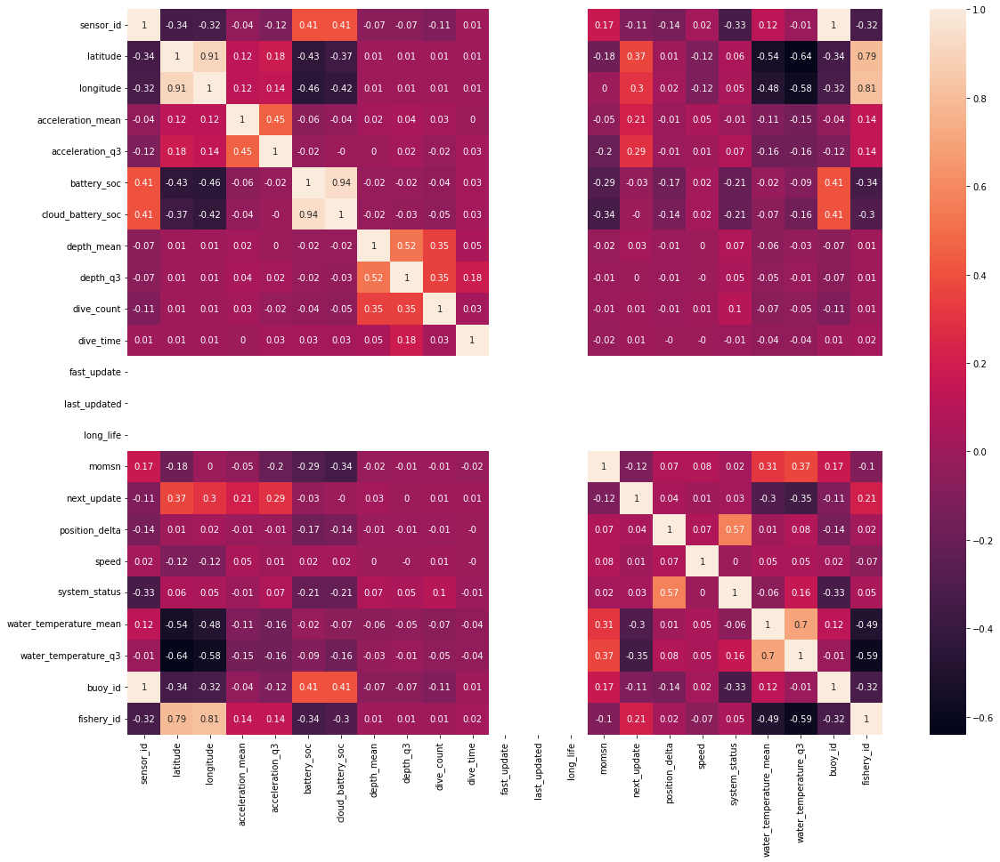

In [69]:
f_corr = plt.figure(figsize=(19, 15))
sns.heatmap(corr_matrix, annot=True)
f_corr.show()

## Analyze Messages by Buoy and by Fishery

In [70]:
fig = px.histogram(merged_buoy_df, x = 'sensor_id')
fig.update_layout(bargap = 0.2)
fig.show()

In [71]:
fig = px.histogram(merged_buoy_df, x = 'fishery_id')
fig.update_layout(bargap = 0.2)
fig.show()

## Analyze Messages over Time

In [72]:
# What is the date range of the buoy messages?
date_range = str(pd.to_datetime(merged_buoy_df['datetime']).dt.date.min()) + ' to ' +str(pd.to_datetime(merged_buoy_df['datetime']).dt.date.max())
print(date_range)

2022-04-12 to 2022-10-04


In [73]:
#  How are messages spread across time? Concentrated over a few months or spread out?

merged_buoy_df['mm'] = pd.to_datetime(merged_buoy_df['datetime']).dt.month

fig = px.histogram(merged_buoy_df, x = 'mm')
fig.update_layout(bargap = 0.2, 
                 xaxis = dict(
        tickmode = 'array',
        tickvals = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
        ticktext = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    ))
fig.show()



## Messages by Geography

In [74]:
merged_buoy_df.head(2)

,sensor_id,datetime,latitude,longitude,acceleration_mean,acceleration_q3,battery_soc,cloud_battery_soc,depth_mean,depth_q3,dive_count,dive_time,fast_update,last_updated,long_life,momsn,next_update,position_delta,speed,system_status,water_temperature_mean,water_temperature_q3,buoy_id,fishery_id,mm
15,103,2022-04-13 21:23:06,47.484776,-63.311108,0.413450,0.638865,48.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,16,120,0.0,0.32,1557.0,2.0,2.0,103,3,4
16,103,2022-04-13 22:23:36,47.484440,-63.311733,0.524319,1.103890,48.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,17,1440,43667.0,0.20,33556501.0,3.0,4.0,103,3,4


In [75]:
# Determine the bounding box all buoys based on latitude and longitude

desc_stats = merged_buoy_df.describe()
desc_stats

,sensor_id,latitude,longitude,acceleration_mean,acceleration_q3,battery_soc,cloud_battery_soc,depth_mean,depth_q3,dive_count,dive_time,fast_update,last_updated,long_life,momsn,next_update,position_delta,speed,system_status,water_temperature_mean,water_temperature_q3,buoy_id,fishery_id,mm
count,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000,0.0,0.0,0.0,29809.000000,29809.000000,29809.000000,29809.000000,2.980900e+04,29809.000000,29809.000000,29809.000000,29809.000000,29809.000000
mean,468.228119,46.922285,-63.060971,1.009972,4.156691,49.326445,51.832467,0.006705,0.017705,0.374048,499.902446,NaN,NaN,NaN,179.285015,656.600356,702.157402,0.604850,1.027272e+06,6.720923,7.769633,468.228119,2.904324,5.361770
std,162.273917,2.334983,2.198386,0.524396,3.280135,17.168277,27.776347,0.148695,0.501465,7.193373,7379.576509,NaN,NaN,NaN,206.430647,374.041981,4383.320325,1.543677,5.805025e+06,8.499190,6.690835,162.273917,0.337888,1.012745
min,103.000000,31.891788,-77.594640,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,2.000000,0.000000,0.000000,0.000000,5.280000e+02,-148.000000,0.000000,103.000000,1.000000,4.000000
25%,472.000000,47.352840,-62.705795,0.678831,2.342645,36.000000,37.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,60.000000,720.000000,13.000000,0.200000,1.045000e+03,2.000000,3.000000,472.000000,3.000000,5.000000
50%,522.000000,47.553330,-62.560770,0.995084,3.400044,44.000000,37.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,110.000000,720.000000,35.000000,0.400000,1.045000e+03,6.000000,6.000000,522.000000,3.000000,5.000000
75%,553.000000,47.834713,-62.350292,1.305320,4.880215,63.000000,64.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,168.000000,720.000000,251.000000,0.740000,2.069000e+03,9.000000,10.000000,553.000000,3.000000,6.000000
max,680.000000,49.237000,-58.327663,10.472172,38.010290,100.000000,100.000000,10.603463,66.359840,207.000000,625803.000000,NaN,NaN,NaN,1113.000000,1440.000000,65461.000000,180.550000,1.006649e+08,30.000000,53.000000,680.000000,3.000000,10.000000


In [76]:
northeast = (desc_stats.loc['max', 'latitude'], desc_stats.loc['max', 'longitude'])
southeast = (desc_stats.loc['min', 'latitude'], desc_stats.loc['max', 'longitude'])
southwest = (desc_stats.loc['min', 'latitude'], desc_stats.loc['min', 'longitude'])
northwest = (desc_stats.loc['max', 'latitude'], desc_stats.loc['min', 'longitude'])

print(f'Northeast: {northeast}')
print(f'Southeast: {southeast}')
print(f'Southwest: {southwest}')
print(f'Northwest: {northwest}')

Northeast: (49.237, -58.327663)
Southeast: (31.891788, -58.327663)
Southwest: (31.891788, -77.59464)
Northwest: (49.237, -77.59464)


In [77]:
# Plot buoy locations with the bounding box measurements

corners = [northeast, southeast, southwest, northwest]
corner_lats = [c[0] for c in corners]
corner_lons = [c[1] for c in corners]

fig = go.Figure(go.Scattermapbox(
    name = "Bounding Box",
    mode = "markers+lines",
    lon = corner_lons,
    lat = corner_lats,
    marker = {'size': 1},
    line={"color": "yellow"}))

fig.add_trace(go.Scattermapbox(
    name = "Buoy Locations",
    mode = "markers",
    lon = merged_buoy_df['longitude'],
    lat = merged_buoy_df['latitude'],
    marker = {'size': 5},
    hovertext = merged_buoy_df['sensor_id'].apply(lambda id: f"Buoy {id}")))

fig.update_layout(
    margin ={'l':0,'t':0,'b':0,'r':0},
    mapbox = {
        'center': {'lon': 10, 'lat': 10},
        'style': "stamen-terrain",
        'center': {'lon': -126, 'lat': 44},
        'zoom': 2})

fig.show()

## Messages by Fishery_id

In [78]:
# Which buoys are in each fishery?
id_by_fishery = merged_buoy_df.astype(str).groupby('fishery_id').agg(lambda x: ','.join(x.unique()))
id_by_fishery = pd.DataFrame(id_by_fishery, columns=['sensor_id'])

d = {}
for index, row in id_by_fishery.iterrows():
    d[index] = row['sensor_id']
d

{'1': '587,589,588,590',
 '2': '680,678,679,674',
 '3': '103,104,107,109,108,105,114,110,111,113,115,112,116,117,118,119,120,121,122,124,123,125,126,127,128,130,129,131,132,307,460,462,461,463,464,466,467,465,468,469,470,471,472,473,474,475,476,478,477,479,480,481,482,483,484,485,488,486,487,489,490,491,492,493,495,494,496,498,497,500,501,499,502,503,504,505,506,507,508,509,511,512,510,514,516,513,515,517,518,519,521,520,522,523,524,526,525,527,528,531,530,529,532,534,533,536,537,535,539,538,540,541,542,543,544,545,547,546,548,549,550,552,551,553,554,555,556,557,559,558,560,561,562,565,564,563,567,566,570,568,569,574,573,572,571,576,575,578,577,579'}

In [79]:
# Number of buoy messages per fishery
merged_buoy_df.groupby('fishery_id').agg(['count']).loc[:,'sensor_id']

,count
fishery_id,
1,412
2,2028
3,27369


In [80]:
# Date range of messages for each fishery

df_fisheryA = merged_buoy_df[merged_buoy_df['fishery_id'] ==1]
df_fisheryB = merged_buoy_df[merged_buoy_df['fishery_id'] ==2]
df_fisheryC = merged_buoy_df[merged_buoy_df['fishery_id'] ==3]

date_range_fisheryA = str(pd.to_datetime(df_fisheryA['datetime']).dt.date.min()) + ' to ' +str(pd.to_datetime(df_fisheryA['datetime']).dt.date.max())
date_range_fisheryB = str(pd.to_datetime(df_fisheryB['datetime']).dt.date.min()) + ' to ' +str(pd.to_datetime(df_fisheryB['datetime']).dt.date.max())
date_range_fisheryC = str(pd.to_datetime(df_fisheryC['datetime']).dt.date.min()) + ' to ' +str(pd.to_datetime(df_fisheryC['datetime']).dt.date.max())

print(f"Date range for Fishery A: {date_range_fisheryA}")
print(f"Date range for Fishery B: {date_range_fisheryB}")
print(f"Date range for Fishery C: {date_range_fisheryC}")

Date range for Fishery A: 2022-07-08 to 2022-10-04
Date range for Fishery B: 2022-06-18 to 2022-09-20
Date range for Fishery C: 2022-04-12 to 2022-08-24


## Label Messages with Buoy Deployment Identifiers

A buoy “deployment” begins when it enters the water (as indicated by an “Entered Water” status) and ends when it leaves the water (“Left Water”). Assign each buoy message a deployment id that represents the deployment that it was a part of. How many deployments occurred? How many times was each buoy deployed? How long did each deployment last?  How many messages are in each deployment (i.e. how long is each time series)?

In [81]:
# Replace NaN with "Unknown" in system_status
merged_buoy_df['system_status'] = merged_buoy_df['system_status'].fillna('Unknown')

# Convert system_status values to integers, except when Unknown
merged_buoy_df['system_status_int'] = merged_buoy_df['system_status'].apply(lambda x : int(x) if x != 'Unknown' else 'Unknown')
merged_buoy_df['system_status_int'].head(10)

15        1557
16    33556501
17    33556501
18    33556501
19    33556501
20    33556501
21    33556501
22    33556501
23    33556501
24    33556501
Name: system_status_int, dtype: int64

In [82]:
# Convert system_status readings to label deployment status
# Uses python scrupt from /scripts/  file called system_codes 

merged_buoy_df['system_status_cat'] = merged_buoy_df['system_status_int'].apply(lambda x : system_codes.parse_system_flags(x) if x!= 'Unknown' else 'Unknown')
merged_buoy_df['deployment_status'] = merged_buoy_df['system_status_cat'].apply(lambda x: system_codes.human_readable_reason(x))
merged_buoy_df['deployment_status'].head(10)

15    Entered Water
16            Moved
17            Moved
18            Moved
19            Moved
20            Moved
21            Moved
22            Moved
23            Moved
24            Moved
Name: deployment_status, dtype: object

In [83]:
merged_buoy_df[['sensor_id', 'deployment_status']].head(10)

,sensor_id,deployment_status
15,103,Entered Water
16,103,Moved
17,103,Moved
18,103,Moved
19,103,Moved
20,103,Moved
21,103,Moved
22,103,Moved
23,103,Moved
24,103,Moved


### Generate deployment id

In [84]:
# Sort the buoy data points by buoy_id and timestamp (so each buoy is organized sequentially) i.e. across fisheries
merged_buoy_df['datetime'] = pd.to_datetime(merged_buoy_df['datetime'])
merged_buoy_df = merged_buoy_df.sort_values(by=['sensor_id', 'datetime']).reset_index(drop=True)
deployment_num = 0

# Deployment number increments at each location where system status equals 'Entered Water'
for index, row in merged_buoy_df.iterrows():
    if row['deployment_status'] == 'Entered Water':
        deployment_num += 1

    # Check to ensure that in case a buoy is placed in water without reporting 'Entered Water'
    elif row['deployment_status'] != 'Entered Water' and index >= 1:
        if row['sensor_id'] != merged_buoy_df.loc[index-1]['sensor_id']:
            deployment_num += 1

    # Set deployment_num as in deployment_id column
    merged_buoy_df.at[index, 'deployment_id'] = deployment_num

merged_buoy_df.head(20)

,sensor_id,datetime,latitude,longitude,acceleration_mean,acceleration_q3,battery_soc,cloud_battery_soc,depth_mean,depth_q3,dive_count,dive_time,fast_update,last_updated,long_life,momsn,next_update,position_delta,speed,system_status,water_temperature_mean,water_temperature_q3,buoy_id,fishery_id,mm,system_status_int,system_status_cat,deployment_status,deployment_id
0,103,2022-04-13 21:23:06,47.484776,-63.311108,0.413450,0.638865,48.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,16,120,0.0,0.32,1557.0,2.0,2.0,103,3,4,1557,"[in_water, update_reason_sws, update_reason_sc...",Entered Water,1.0
1,103,2022-04-13 22:23:36,47.484440,-63.311733,0.524319,1.103890,48.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,17,1440,43667.0,0.20,33556501.0,3.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
2,103,2022-04-13 23:23:36,47.484764,-63.311810,0.345631,1.103890,48.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,18,1440,43655.0,0.10,33556501.0,0.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
3,103,2022-04-14 00:23:36,47.484920,-63.311733,0.230597,1.103890,48.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,19,1440,43658.0,0.12,33556501.0,-1.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
4,103,2022-04-14 01:23:36,47.485010,-63.311676,0.350084,1.103890,47.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,20,1440,43661.0,0.46,33556501.0,-1.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
5,103,2022-04-14 02:23:36,47.485012,-63.311626,0.476555,1.103890,47.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,21,1440,43665.0,0.23,33556501.0,0.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
6,103,2022-04-14 03:23:36,47.485054,-63.311530,0.374354,1.103890,46.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,22,1440,43671.0,0.29,33556501.0,0.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
7,103,2022-04-14 04:23:36,47.484894,-63.311417,0.619980,1.886484,46.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,23,1440,43682.0,0.21,33556501.0,0.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
8,103,2022-04-14 05:23:46,47.484710,-63.311096,0.229302,1.886484,46.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,24,1440,43710.0,0.19,33556501.0,-1.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0
9,103,2022-04-14 06:23:36,47.484165,-63.310860,0.356383,1.886484,46.0,64.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,25,1440,43737.0,0.26,33556501.0,-1.0,4.0,103,3,4,33556501,"[in_water, update_reason_moved]",Moved,1.0


In [49]:
# How many deployments occurred by fishery?

depl_by_fishery = merged_buoy_df.groupby(['fishery_id']).count()['deployment_id'].reset_index()
depl_by_fishery

,fishery_id,deployment_id
0,1,412
1,2,2028
2,3,27369


In [87]:
# How many deployments occurred by fishery by buoy?

depl_by_fishery_by_buoy = merged_buoy_df.groupby(['fishery_id', 'sensor_id']).agg(['count']).loc[:,'deployment_id'].reset_index()
depl_by_fishery_by_buoy

,fishery_id,sensor_id,count
0,1,587,71
1,1,588,94
2,1,589,96
3,1,590,151
4,2,674,453
5,2,678,569
6,2,679,460
7,2,680,546
8,3,103,519
9,3,104,182


In [91]:
# Total number of deployments (across fisheries and buoys)
merged_buoy_df['deployment_id'].max()

2156.0

In [90]:
# How many messages in each deployment

msgs_per_deployment = merged_buoy_df.groupby(['fishery_id', 'sensor_id', 'deployment_id']).agg(['count']).loc[:, 'deployment_status'].reset_index()
msgs_per_deployment

,fishery_id,sensor_id,deployment_id,count
0,1,587,1992.0,52
1,1,587,1993.0,6
2,1,587,1994.0,13
3,1,588,1995.0,6
4,1,588,1996.0,8
5,1,588,1997.0,6
6,1,588,1998.0,6
7,1,588,1999.0,4
8,1,588,2000.0,5
9,1,588,2001.0,7


In [92]:
# How long did each deployment last?


# Part 2 - Buoy Motion Analysis

## Calculate Buoy Deployments’ Smallest Enclosing Circles

#### Buoy Swing Range

To estimate the swing range for a buoy deployment, we found the smallest enclosing circle around the deployment's points and then took that circle's radius.

The algorithm used to create the circle performs distance calculations that assume all points are on an X-Y plane (Cartesian coordinates). GPS coordinates, however, take into account the curvature of the earth. Therefore, we tested two different approaches to calculating the circle to see if the results differed strongly: 

(1) Treating lat/lon coordinates as X-Y points, given that all of the points are relatively close together and the curvature of the earth wouldn't be a big factor.

(2) Converting the points to points on a UTM (Universal Transverse Mercador) grid system, a type of Cartesian coordinate system.

### Method 1: Treating coordinates as XY points

In [100]:
def calculate_all_circles(df, deployment_col = 'deployment_id'):
    """
    """
    circles = {}
    for deployment_id in set(df[deployment_col]):
        single_deployment = df[df[deployment_col] == deployment_id]
        buoy_points = single_deployment[['longitude','latitude']]
        buoy_points = buoy_points.to_records(index=False)
        buoy_points = list(buoy_points)
        circle = smallest_enclosing_circle.make_circle(buoy_points)
        circles[deployment_id] = {'buoy_id': int(max(single_deployment['buoy_id'])), 'deployment_id': deployment_id, 'first_reading': min(single_deployment['datetime']), 'last_reading': max(single_deployment['datetime']), 'circle_center_lon': circle[0],'circle_center_lat': circle[1],'circle_radius': circle[2], 'num_readings': len(single_deployment), 'max_acceleration': max(single_deployment['acceleration_q3']), 'max_divetime': max(single_deployment['dive_time']), 'first_momsn': min(single_deployment['momsn']), 'last_momsn': max(single_deployment['momsn'])}
    return circles

In [102]:
all_circles = calculate_all_circles(merged_buoy_df, 'deployment_id')
all_circles_df = (pd.DataFrame
                  .from_dict(all_circles)
                  .T
                  .sort_values(by=['circle_radius', 'num_readings'], ascending=False))
all_circles_df.head(2)

,buoy_id,deployment_id,first_reading,last_reading,circle_center_lon,circle_center_lat,circle_radius,num_readings,max_acceleration,max_divetime,first_momsn,last_momsn
1963.0,577,1963.0,2022-05-11 08:15:42,2022-07-20 18:16:29,-61.385464,47.936651,2.472035,941,7.835812,0.0,65,1006
406.0,460,406.0,2022-05-15 12:02:46,2022-07-10 08:09:36,-60.324715,47.868325,2.413964,753,13.355459,0.0,76,831


According to USGS, 1 degree of latitude ~= 111 kilometers, and 1 degree of longitude ~= 88 kilometers. So we will average the two in our conversion for a rough estimate of distance (radius in degrees * 99.5).

https://www.usgs.gov/faqs/how-much-distance-does-degree-minute-and-second-cover-your-maps

In [103]:
all_circles_df['circle_radius_in_km'] = all_circles_df['circle_radius'] * 99.5
all_circles_df['circle_radius_in_m'] = all_circles_df['circle_radius_in_km'] * 1000
all_circles_df.head(2)

,buoy_id,deployment_id,first_reading,last_reading,circle_center_lon,circle_center_lat,circle_radius,num_readings,max_acceleration,max_divetime,first_momsn,last_momsn,circle_radius_in_km,circle_radius_in_m
1963.0,577,1963.0,2022-05-11 08:15:42,2022-07-20 18:16:29,-61.385464,47.936651,2.472035,941,7.835812,0.0,65,1006,245.967513,245967.51349
406.0,460,406.0,2022-05-15 12:02:46,2022-07-10 08:09:36,-60.324715,47.868325,2.413964,753,13.355459,0.0,76,831,240.189442,240189.441837


### Method 2: Converting coordinates to UTM grid points


In [110]:
from typing import List, Dict, Tuple
import utm
def calculate_all_circles_utm(
    df: pd.DataFrame,
    deployment_col: str='deployment_id') -> List[Dict]:
    """
    For each buoy deployment group in the DataFrame, converts
    each point's latitude and longitude coordinates into UTM
    (Universal Transverse Mercator) grid coordinates. Then draws
    the smallest enclosing circle around the grid coordinates,
    converting the circle's center back to lat/lon in the final
    step.

    Paramters:
        deployment_col (str): The name of the column with
            the deployment identifier.

    Returns:
        (Dict): A dictionary holding computed circle
            information for each deployment, including
            the circle radius in meters and the circle
            center in latitude and longitude.

    References:
    - https://pubs.usgs.gov/fs/2001/0077/report.pdf
    """
    
    # Define local function
    def _lat_lon_to_utm_coords(row: pd.Series) -> Tuple[int, int, str, str]:
        """
        Local function to produce a tuple of UTM
        coordinates from a DataFrame row containing
        `position_latitude` and `position_longitude`
        columns.

        Parameters:
            row (pd.Series): A Pandas Series
                repesenting a row.

        Returns:
            (float, float, str, str): A four-item tuple
                consisting of the UTM x-coordinate,
                y-coordinate, zone number, and zone letter.
        """
        u = utm.from_latlon(row['latitude'], row['longitude'])
        x, y, zone_num, zone_letter = u
        return x, y, str(zone_num), str(zone_letter)

    # Generate circles
    circles = {}
    for deployment_id in set(df[deployment_col]):

        # Get messages for deployment
        single_deployment = df[df[deployment_col] == deployment_id]

        # Convert points to UTM coordinates (uses XY plane)
        buoy_points = single_deployment[['longitude','latitude']]
        buoy_points[['utm_x', 'utm_y', 'utm_zone_num', 'utm_zone_letter']] = (
            buoy_points.apply(
                 func=_lat_lon_to_utm_coords,
                 axis="columns",
                 result_type="expand"))
        
        # Set appropriate zone number and letter
        buoy_points['utm_zone'] = buoy_points['utm_zone_num'] + buoy_points['utm_zone_letter']
        unique_zones = buoy_points['utm_zone'].unique().tolist()

        if len(unique_zones) > 1:
            print(f"Warning - Deployment {deployment_id} has points "
                f"spanning more than one UTM zone: {', '.join(unique_zones)}.")
            max_zone = buoy_points.groupby('utm_zone').count().idxmax().iloc[0]
            first_row = buoy_points.query('`utm_zone` == @max_zone').head(1).iloc[0, :]
        else:
            first_row = buoy_points.iloc[0, :]

        zone_num = int(first_row['utm_zone_num'])
        zone_letter = first_row['utm_zone_letter']

        # Otherwise, prepare XY points for smallest circle calculation
        xy_points = buoy_points[['utm_x', 'utm_y']].to_records(index=False)
        
        # Run smallest enclosing circle algorithm
        circle = smallest_enclosing_circle.make_circle(list(xy_points))

        # Convert circle results back to lat-long
        c_x, c_y, c_radius = circle
        c_lat, c_lon = utm.to_latlon(c_x, c_y, zone_num, zone_letter)

        # Aggregate results
        circles[deployment_id] = {
            'buoy_id': int(max(single_deployment['buoy_id'])),
            'deployment_id': deployment_id,
            'first_reading': min(single_deployment['datetime']),
            'last_reading': max(single_deployment['datetime']),
            'circle_center_lon': c_lon,
            'circle_center_lat': c_lat,
            'circle_radius_in_m': c_radius, 
            'num_readings': len(single_deployment),
            'max_acceleration': max(single_deployment['acceleration_q3']),
            'max_divetime': max(single_deployment['dive_time']),
            'first_momsn': min(single_deployment['momsn']),
            'last_momsn': max(single_deployment['momsn'])
        }

    return circles

In [112]:
# Draw the smallest possible enclosing circle around each deployment group
# using UTM (Universal Transverse Mercator) grid coordinates
all_circles_utm = calculate_all_circles_utm(merged_buoy_df, 'deployment_id')
all_circles_utm_df = (pd.DataFrame
                  .from_dict(all_circles_utm)
                  .T
                  .sort_values(
                      by=['circle_radius_in_m', 'num_readings'],
                      ascending=False))
all_circles_utm_df['circle_radius_in_km'] = all_circles_utm_df['circle_radius_in_m'] / 1000
all_circles_utm_df.head(10)

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 406.0 has points spanning more than one UTM zone: 20T, 20U, 21U.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 697.0 has points spanning more than one UTM zone: 20T, 20U.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 1100.0 has points spanning more than one UTM zone: 20U, 20T.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:65: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 1352.0 has points spanning more than one UTM zone: 20T, 20U.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 1548.0 has points spanning more than one UTM zone: 20T, 21T.
Warning - Deployment 1564.0 has points spanning more than one UTM zone: 20U, 20T.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 1571.0 has points spanning more than one UTM zone: 20T, 20U.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:65: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 1963.0 has points spanning more than one UTM zone: 20T, 20U, 21U.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 2035.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2038.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2039.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2042.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2051.0 has points spanning more than one UTM zone: 19T, 19S.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 2059.0 has points spanning more than one UTM zone: 19T, 19S.
Warning - Deployment 2060.0 has points spanning more than one UTM zone: 18R, 18S.
Warning - Deployment 2066.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2068.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2069.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2070.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2074.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2084.0 has points spanning more than one UTM zone: 19S, 19T.

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-


Warning - Deployment 2085.0 has points spanning more than one UTM zone: 19T, 19S.
Warning - Deployment 2099.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2104.0 has points spanning more than one UTM zone: 19T, 19S.
Warning - Deployment 2106.0 has points spanning more than one UTM zone: 19S, 19T.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 2115.0 has points spanning more than one UTM zone: 19T, 19S.
Warning - Deployment 2116.0 has points spanning more than one UTM zone: 19T, 19S.
Warning - Deployment 2130.0 has points spanning more than one UTM zone: 19S, 19T.


<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-4ac56b7de3b7>:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-110-

Warning - Deployment 2137.0 has points spanning more than one UTM zone: 19S, 19T.
Warning - Deployment 2148.0 has points spanning more than one UTM zone: 19T, 19S.


,buoy_id,deployment_id,first_reading,last_reading,circle_center_lon,circle_center_lat,circle_radius_in_m,num_readings,max_acceleration,max_divetime,first_momsn,last_momsn,circle_radius_in_km
1548.0,546,1548.0,2022-05-03 00:23:07,2022-06-18 11:37:06,-62.997307,46.264149,241076.452366,1052,19.33511,0.0,46,1100,241.076452
406.0,460,406.0,2022-05-15 12:02:46,2022-07-10 08:09:36,-62.993522,47.88943,228895.364469,753,13.355459,0.0,76,831,228.895364
1963.0,577,1963.0,2022-05-11 08:15:42,2022-07-20 18:16:29,-63.002298,48.42722,221739.017557,941,7.835812,0.0,65,1006,221.739018
1564.0,547,1564.0,2022-06-20 12:00:16,2022-06-20 17:15:10,-63.375802,47.984691,101814.302688,5,1.126925,0.0,157,161,101.814303
105.0,111,105.0,2022-04-26 17:43:30,2022-05-16 23:00:04,-62.414613,46.676079,90105.946201,392,5.397608,0.0,41,435,90.105946
1352.0,529,1352.0,2022-05-11 06:55:49,2022-06-27 20:40:20,-62.614022,47.438238,84385.648713,829,10.685657,0.0,61,891,84.385649
1571.0,548,1571.0,2022-05-07 10:52:24,2022-07-07 09:04:36,-62.58075,47.938371,78608.922007,988,12.46756,0.0,59,1054,78.608922
1284.0,524,1284.0,2022-05-20 13:36:46,2022-06-02 13:45:06,-62.262904,47.055213,71493.133772,287,12.985987,0.0,84,370,71.493134
1391.0,532,1391.0,2022-04-22 11:26:06,2022-05-06 09:56:20,-62.756574,47.028225,67093.9001,227,19.961653,39602.0,23,250,67.0939
1828.0,567,1828.0,2022-04-22 12:16:46,2022-05-06 15:10:08,-62.786178,47.000248,61465.217628,218,11.387828,0.0,22,240,61.465218


### Evaluating UTM circles v/s XY coord circles

In [114]:
df1 = (all_circles_utm_df[['circle_radius_in_km', 'circle_center_lat', 'circle_center_lon']]
  .rename(columns={
      'circle_radius_in_km': 'utm_circle_radius_km',
      'circle_center_lat': 'utm_circle_center_lat',
      'circle_center_lon': 'utm_circle_center_lon'
      }))

df2 = all_circles_df[['circle_radius_in_km', 'circle_center_lat', 'circle_center_lon']]
circle_results_df = df2.join(df1)
circle_results_df['radius_diff'] = circle_results_df['circle_radius_in_km'] - circle_results_df['utm_circle_radius_km']
circle_results_df.head(5)

,circle_radius_in_km,circle_center_lat,circle_center_lon,utm_circle_radius_km,utm_circle_center_lat,utm_circle_center_lon,radius_diff
1963.0,245.967513,47.936651,-61.385464,221.739018,48.42722,-63.002298,24.228496
406.0,240.189442,47.868325,-60.324715,228.895364,47.88943,-62.993522,11.294077
1548.0,172.032492,46.644822,-61.087663,241.076452,46.264149,-62.997307,-69.04396
1564.0,135.395628,47.97667,-63.37343,101.814303,47.984691,-63.375802,33.581325
1571.0,97.679393,47.882881,-62.590063,78.608922,47.938371,-62.58075,19.070471


In [122]:
# Summarise difference in 2 calculations for circle radius
circle_results_df.agg(
    {
        "radius_diff": ["min", "max", "mean", "skew"]
    }
)

,radius_diff
min,-69.043960
max,33.581325
mean,0.045593
skew,-19.995632


In [128]:
def plot_buoy_swing_range(buoys_df, circles_df, deployment_id):
  """
  """
  # Subset data to deployment
  points_subset = buoys_df.query("`deployment_id` == @deployment_id")
  circle_subset = circles_df.query("`deployment_id` == @deployment_id")

  # Get lat, lon, and radius or 
  circle_lon = circle_subset['circle_center_lon'].values[0]
  circle_lat = circle_subset['circle_center_lat'].values[0]
  circle_radius = circle_subset['circle_radius_in_m'].values[0]

  # Create map centered at smallest circle center
  m = folium.Map(location=[circle_lat, circle_lon], zoom_start=18)

  # Draw circle as first layer
  folium.Circle(
      radius=circle_radius,
      location=[circle_lat, circle_lon],
      color="yellow",
      fill=False
  ).add_to(m)

  # Draw circle center as second layer
  folium.Circle(
      radius=1,
      location=[circle_lat, circle_lon],
      color="yellow",
      fill=True,
      tooltip=f"<h4>Circle Center: ({circle_lat}, {circle_lon})</h4>"
  ).add_to(m)

  # Draw points as third layer
  for i, pt in points_subset[[
      'sensor_id',
      'latitude',
      'longitude',
      'datetime',
      'fishery_id']].iterrows():

    sensor_id, lat, lon, datetime, fishery_id = pt
    tooltip = f'''
      <div>
        <h4>Buoy {sensor_id}</h4>
        <h5>Location: ({lat}, {lon})<h5>
        <h5>Timestamp: {datetime}</h5>
        <h5>Fisher: {fishery_id}</h5>
      </div>
    '''

    folium.CircleMarker(
        location=[lat, lon],
        radius=1,
        fill=True,
        tooltip=tooltip).add_to(m)

  # Display map
  return m

In [129]:
for d_id in [1, 3, 6, 8, 15, 11, 12, 22, 45, 121]:
  display(HTML(f"<h3>Deployment {d_id} - Straight Euclidean</h3>"))
  display(plot_buoy_swing_range(merged_buoy_df, all_circles_df, deployment_id=d_id))
  display(HTML(f"<h3>Deployment {d_id} - UTM Conversion</h3>"))
  display(plot_buoy_swing_range(merged_buoy_df, all_circles_utm_df, deployment_id=d_id))